# Section 2
## Structuring Biomedical Data Using Networks 

- talk about features of biomedical datasets and the issues around working with them
 - heterogeneity of data types
 - outliers, noise, missing values
 - network construction decisions - filtering, kNN, similarity calulation - effects of different data modalities
 - introduce some of the key data types - transcriptomics, methylation etc.
 - introduce GenScot study and describe the data
- notebooks doing the initial processing of example data set(s) culminating with the GenScot set
- emerge from sessions with a selection of networks to work on later in the workshop

# Workshop Agenda: Working with ASD Data and Network Analysis

## 1. Data Management
   - **1.1 Saving Data**: Techniques for efficient data storage.
   - **1.2 Loading Data**: Best practices for importing data.
   - **1.3 Data Cleaning**:
     - Checking for and handling missing data.
     - Outlier detection and remediation.
   - **1.4 Data Visualization**:
     - Creating metadata plots for basic analysis of patient numbers.
     - Evaluating features through simple plots.
   - **1.5 Assessing Data Quality**:
     - Checking for heterogeneity in the data.

## 2. Network Generation
   - **2.1 Correlation Matrix**: Construction and analysis.
   - **2.2 Data Preprocessing**:
     - Scaling and normalization.
     - Log transformation.
     - Analyzing variable distribution.
   - **2.3 Correlation Measures**:
     - Pearson, Spearman, and Euclidean correlations.
     - Absolute biweight midcorrelation.
     - Log-transformed Pearson correlation.
   - **2.4 Outputting the Adjacency Matrix**: From correlation to network structure.

## 3. Network Sparsification
   - **3.1 Thresholding Methods**:
     - Thresholding by degree.
     - Thresholding by closeness.
     - Thresholding by edge weight.
   - **3.2 k-Nearest Neighbors (KNN)**:
     - Basic KNN sparsification.
     - KNN combined with thresholding.
   - **3.3 Advanced Sparsification Techniques**:
     - Maximizing edge weight retention.
   - **3.4 Managing Graph Objects**:
     - Selecting the optimal graph representat

## TODO add SFARI genes as labels and show some visualization techniquesion for progressing to gene networks.

## 4. Types of Networks
   - **4.1 Gene Correlation Networks**: Building and analyzing.
   - **4.2 Weighted Gene Co-expression Network Analysis (WGCNA)**:
     - Building networks analogous to Protein-Protein Interaction (PPI) networks.
   - **4.3 Patient Similarity Networks**: Exploring new methodologies for patient data.

## 5. Integrating Other Datasets
   - **5.1 Data Integration**:
     - Techniques for incorA sessions to enhance understanding and engagement.
r datasets

## Data

- ScotGen,
- ASD transcriptomic,
- Synaptic PPI 

In [1]:
# import used libraries
import pandas as pd
import numpy as np
from scipy import stats
import networkx as nx
import matplotlib.pyplot as plt
import pickle

In [24]:
with open(r"C:\cdt_data\ismb_data\ISMB_TCGA_GE.pkl", 'rb') as file:
    data = pickle.load(file)
print(data.keys())

dict_keys(['datExpr', 'datMeta'])


In [3]:
data["datMeta"]

,patient,race,gender,sample_type,cigarettes_per_day,Smoked,sizeFactor,replaceable
_row,,,,,,,,
TCGA-38-7271,TCGA-38-7271,white,female,Primary Tumor,1.3699,Smoker,0.5841,True
TCGA-55-7914,TCGA-55-7914,white,female,Primary Tumor,0.274,Smoker,0.9873,True
TCGA-95-7043,TCGA-95-7043,white,female,Primary Tumor,2.1918,Smoker,0.5439,True
TCGA-73-4658,TCGA-73-4658,white,female,Primary Tumor,1.3699,Smoker,0.7715,True
TCGA-86-8076,TCGA-86-8076,white,male,Primary Tumor,0,Never,1.313,True
...,...,...,...,...,...,...,...,...
TCGA-86-8073,TCGA-86-8073,white,male,Primary Tumor,2.1918,Smoker,1.9733,True
TCGA-MN-A4N4,TCGA-MN-A4N4,white,male,Primary Tumor,0,Never,1.0464,True
TCGA-53-7626,TCGA-53-7626,white,female,Primary Tumor,1.9178,Smoker,1.7208,True


# TODO: some interesting plots about the metadata

C:\Users\sebestyenkamp\anaconda3\envs\ismbenv\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


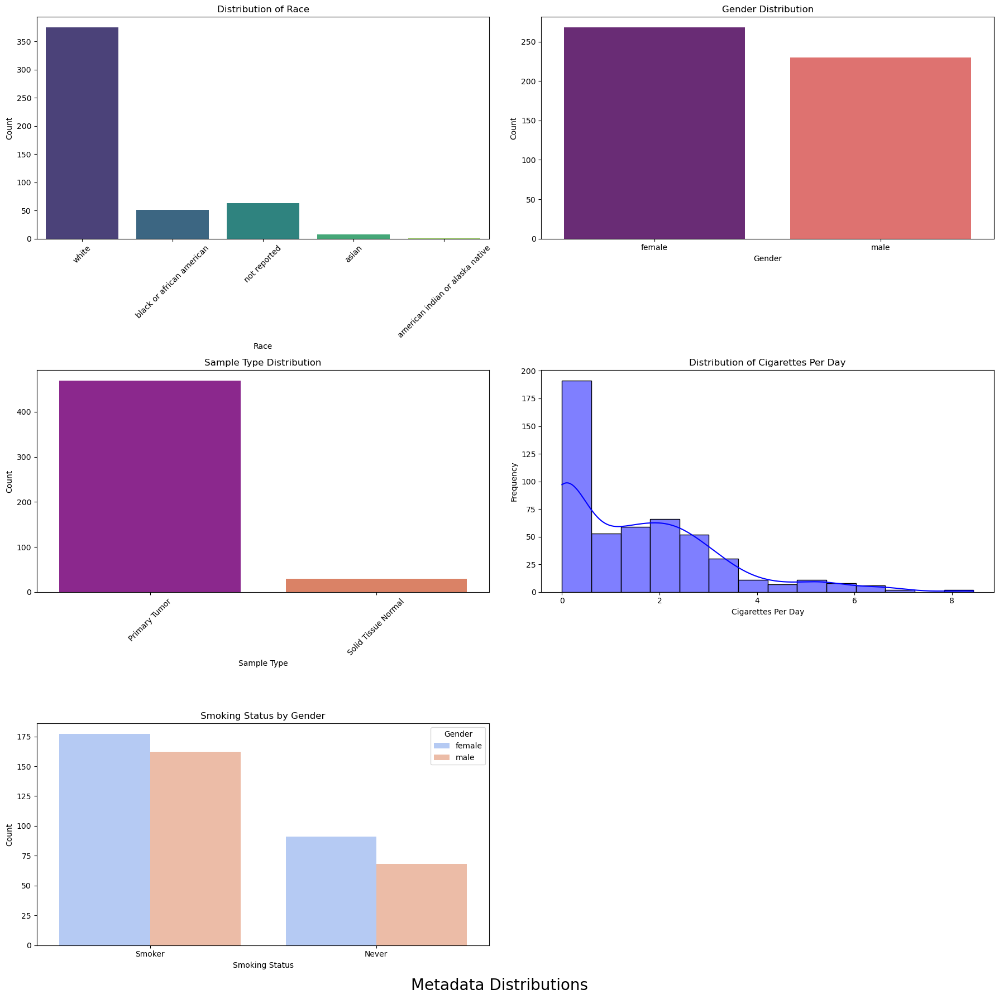

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set up the figure and axes for a 2-column layout
fig, axes = plt.subplots(3, 2, figsize=(18, 18))
fig.suptitle('Metadata Distributions', fontsize=20, y=0)

# Plot 1: Distribution of Race
sns.countplot(ax=axes[0, 0], x='race', data=data['datMeta'], palette='viridis')
axes[0, 0].set_title('Distribution of Race')
axes[0, 0].set_xlabel('Race')
axes[0, 0].set_ylabel('Count')
axes[0, 0].tick_params(axis='x', rotation=45)

# Plot 2: Gender Distribution
sns.countplot(ax=axes[0, 1], x='gender', data=data['datMeta'], palette='magma')
axes[0, 1].set_title('Gender Distribution')
axes[0, 1].set_xlabel('Gender')
axes[0, 1].set_ylabel('Count')

# Plot 3: Sample Type Distribution
sns.countplot(ax=axes[1, 0], x='sample_type', data=data['datMeta'], palette='plasma')
axes[1, 0].set_title('Sample Type Distribution')
axes[1, 0].set_xlabel('Sample Type')
axes[1, 0].set_ylabel('Count')
axes[1, 0].tick_params(axis='x', rotation=45)

# Plot 4: Distribution of Cigarettes Per Day
sns.histplot(ax=axes[1, 1], data=data['datMeta']['cigarettes_per_day'], kde=True, color='blue')
axes[1, 1].set_title('Distribution of Cigarettes Per Day')
axes[1, 1].set_xlabel('Cigarettes Per Day')
axes[1, 1].set_ylabel('Frequency')

# Plot 5: Smoking Status by Gender
sns.countplot(ax=axes[2, 0], x='Smoked', hue='gender', data=data['datMeta'], palette='coolwarm')
axes[2, 0].set_title('Smoking Status by Gender')
axes[2, 0].set_xlabel('Smoking Status')
axes[2, 0].set_ylabel('Count')
axes[2, 0].legend(title='Gender')

# Hide the empty subplot
axes[2, 1].axis('off')

# Adjust layout for better fit
plt.tight_layout()
plt.show()


In [28]:
expression_data = data["datExpr"]
expression_data

_row,ENSG00000000003.15,ENSG00000000419.13,ENSG00000000457.14,ENSG00000000460.17,ENSG00000000938.13,ENSG00000000971.16,ENSG00000001036.14,ENSG00000001084.13,ENSG00000001167.14,ENSG00000001460.18,...,ENSG00000288586.1,ENSG00000288596.2,ENSG00000288598.1,ENSG00000288611.1,ENSG00000288612.1,ENSG00000288638.1,ENSG00000288658.1,ENSG00000288663.1,ENSG00000288670.1,ENSG00000288675.1
TCGA-38-7271,11.3668,10.3673,9.7884,8.2552,10.6173,12.8447,10.8836,10.4437,10.8112,9.1178,...,4.4411,5.6909,3.8172,5.5378,4.5573,5.4255,5.1694,4.0073,7.97,4.664
TCGA-55-7914,11.5434,10.5282,9.7292,7.9951,8.4858,10.4696,10.4737,7.9065,11.8983,8.5842,...,4.768,8.0948,4.2182,3.5233,4.975,2.4821,6.0753,4.975,8.8543,4.3015
TCGA-95-7043,11.411,11.2018,9.4449,8.3546,7.3211,10.7856,11.6185,14.1836,10.8329,8.8155,...,4.2248,7.3539,5.0121,4.2248,4.8311,4.7304,5.5053,4.9246,7.6064,3.8623
TCGA-73-4658,12.2149,10.3249,9.234,7.7537,11.0656,12.3631,10.9023,10.06,11.2092,9.0663,...,4.2146,6.0253,3.8231,4.0984,4.6727,7.1082,7.1615,3.6533,7.3223,5.2312
TCGA-86-8076,11.2882,10.2095,9.8186,7.9844,10.5213,13.7848,11.2318,10.8315,10.5784,9.6428,...,4.7844,6.8675,4.5078,2.4821,5.1468,3.3897,4.2833,4.4553,8.1011,4.8254
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TCGA-86-8073,10.7676,10.5503,9.0277,8.2811,9.9471,11.8641,11.237,14.2843,10.9497,8.8266,...,4.2611,7.157,4.2187,5.2566,5.276,2.4821,6.695,5.1967,7.8098,4.3418
TCGA-MN-A4N4,11.656,11.0739,9.5578,8.7883,8.9532,11.0791,10.5202,11.331,11.3659,8.8701,...,4.3317,7.6037,5.0518,7.4063,6.5835,3.0746,5.9828,4.9634,7.9208,5.1745
TCGA-53-7626,10.8912,10.1742,9.6307,8.0179,10.6328,11.247,10.4815,9.8428,10.5795,9.86,...,5.6458,6.6984,4.646,3.1345,4.8113,3.8962,5.9768,4.2816,8.4192,4.4566
TCGA-44-A47G,11.32,9.9137,9.3312,7.8703,11.3029,12.8687,11.2659,12.4677,10.9404,9.4188,...,4.6125,8.0939,5.1263,2.4821,5.2619,5.0279,8.793,5.173,7.951,4.465


498 rows × 22637 columns is a quite large matrix, thus we have to consider reducing the dimensionality.


# Filtering before calculating the correlation matrices  

- Filter by Variance: Select genes with high variance across samples, as low variance genes might not contribute significantly to the analysis.
- 
Filter by Mean Expression: Select genes with high mean expression levels
- 
Use Principal Component Analysis (PCA): Reduce the dimensionality of the data using PCA before computing correlations.

In [31]:
# For testing purposes create a dummy dataset
expression_data = expression_data.iloc[:, :3000]

In [32]:
expression_data.describe()

_row,ENSG00000000003.15,ENSG00000000419.13,ENSG00000000457.14,ENSG00000000460.17,ENSG00000000938.13,ENSG00000000971.16,ENSG00000001036.14,ENSG00000001084.13,ENSG00000001167.14,ENSG00000001460.18,...,ENSG00000105755.8,ENSG00000105767.3,ENSG00000105771.14,ENSG00000105778.19,ENSG00000105784.15,ENSG00000105792.19,ENSG00000105793.16,ENSG00000105808.18,ENSG00000105810.10,ENSG00000105819.14
count,498.0000,498.0000,498.0000,498.0000,498.000,498.0000,498.0000,498.0000,498.0000,498.0000,...,498.0000,498.0000,498.0000,498.0000,498.0000,498.0000,498.0000,498.0000,498.0000,498.0000
unique,491.0000,492.0000,488.0000,492.0000,493.000,493.0000,494.0000,492.0000,494.0000,489.0000,...,492.0000,493.0000,496.0000,493.0000,493.0000,494.0000,493.0000,496.0000,496.0000,487.0000
top,12.6972,10.2051,9.7173,7.6906,9.473,12.4053,11.0237,9.1215,10.5196,9.3976,...,9.2605,11.4055,11.4934,11.1582,4.0696,6.5212,9.8501,6.0963,10.5293,11.9959
freq,2.0000,2.0000,2.0000,2.0000,2.000,2.0000,2.0000,2.0000,2.0000,2.0000,...,3.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000


In [34]:
# Ensure all columns are numeric
expression_data = expression_data.apply(pd.to_numeric, errors='coerce')

# Drop columns that could not be converted to numeric (if any)
expression_data = expression_data.dropna(axis=1, how='all')

In [35]:
expression_data.shape

(498, 3000)

In [38]:
# Calculate variance for each gene
gene_variances = expression_data.var(axis=0)

# Select the top 2000 most variable genes
top_genes = gene_variances.nlargest(2000).index

# Subset the data to include only the top variable genes
high_var_data = expression_data[top_genes]

# Check the shape of the filtered data
print(high_var_data.shape)


(498, 2000)


In [55]:
# Calculate mean expression for each gene
gene_means = expression_data.mean(axis=0)

# Select the top 2000 genes with the highest mean expression
top_genes = gene_means.nlargest(2000).index.to_list()

# Subset the data to include only the top mean expressed genes
filtered_data = expression_data[top_genes]

# Check the shape of the filtered data
print(filtered_data.shape)

# Calculate the correlation matrix
coexpression_matrix = filtered_data.corr()

# Save the co-expression matrix to a file (optional)
coexpression_matrix.to_csv('coexpression_matrix_filtered.csv')

# Print a subset of the co-expression matrix
print(coexpression_matrix.iloc[:10, :10])


(498, 2000)
_row                ENSG00000198804.2  ENSG00000198886.2  ENSG00000075624.17  \
_row                                                                           
ENSG00000198804.2            1.000000           0.904372            0.069656   
ENSG00000198886.2            0.904372           1.000000            0.079794   
ENSG00000075624.17           0.069656           0.079794            1.000000   
ENSG00000210082.2            0.728999           0.590301            0.112387   
ENSG00000198938.2            0.917104           0.878362            0.158800   
ENSG00000156508.19          -0.304720          -0.315103            0.039232   
ENSG00000087086.15           0.000422           0.015137            0.192305   
ENSG00000168878.19           0.153867           0.115640           -0.157508   
ENSG00000019582.15           0.006397          -0.037209            0.338270   
ENSG00000198712.1            0.907363           0.925366            0.159937   

_row                ENSG000

In [58]:
expression_data.shape

(498, 22637)

In [60]:
from sklearn.decomposition import PCA

# Standardize the data
standardized_data = (expression_data - expression_data.mean()) / expression_data.std()

# Apply PCA to reduce dimensionality
pca = PCA(n_components=498)  # Number of components to keep
pca_data = pca.fit_transform(standardized_data)

# Convert PCA result to DataFrame
pca_df = pd.DataFrame(pca_data, index=expression_data.index)

# Calculate the correlation matrix
coexpression_matrix = pd.DataFrame(np.corrcoef(pca_df.T), index=pca_df.columns, columns=pca_df.columns)

# Save the co-expression matrix to a file (optional)
coexpression_matrix.to_csv('coexpression_matrix_pca.csv')

# Print a subset of the co-expression matrix
print(coexpression_matrix.iloc[:10, :10])


              0             1             2             3             4  \
0  1.000000e+00  3.350726e-16 -2.244189e-16 -9.115414e-17  7.446673e-17   
1  3.350726e-16  1.000000e+00  1.813904e-16  2.079138e-16  8.927496e-17   
2 -2.244189e-16  1.813904e-16  1.000000e+00  6.320727e-16 -8.526600e-17   
3 -9.115414e-17  2.079138e-16  6.320727e-16  1.000000e+00  1.901773e-16   
4  7.446673e-17  8.927496e-17 -8.526600e-17  1.901773e-16  1.000000e+00   
5  1.388986e-16  6.221858e-17 -3.598141e-16  2.212479e-16 -4.654083e-16   
6  1.644546e-16 -1.485283e-16 -4.310739e-16 -6.580675e-17  1.750374e-16   
7  4.064186e-16 -1.001722e-16 -6.229930e-16 -1.809367e-16 -4.321861e-17   
8  2.349151e-17 -7.334105e-17 -2.785614e-17  5.570468e-17 -2.303924e-16   
9  1.863630e-16 -3.626989e-17 -1.529649e-16  3.013068e-18 -1.375347e-18   

              5             6             7             8             9  
0  1.388986e-16  1.644546e-16  4.064186e-16  2.349151e-17  1.863630e-16  
1  6.221858e-17 -1.485283e

In [13]:
expression_data

_row,ENSG00000000003.15,ENSG00000000419.13,ENSG00000000457.14,ENSG00000000460.17,ENSG00000000938.13,ENSG00000000971.16,ENSG00000001036.14,ENSG00000001084.13,ENSG00000001167.14,ENSG00000001460.18,...,ENSG00000288586.1,ENSG00000288596.2,ENSG00000288598.1,ENSG00000288611.1,ENSG00000288612.1,ENSG00000288638.1,ENSG00000288658.1,ENSG00000288663.1,ENSG00000288670.1,ENSG00000288675.1
TCGA-38-7271,11.3668,10.3673,9.7884,8.2552,10.6173,12.8447,10.8836,10.4437,10.8112,9.1178,...,4.4411,5.6909,3.8172,5.5378,4.5573,5.4255,5.1694,4.0073,7.97,4.664
TCGA-55-7914,11.5434,10.5282,9.7292,7.9951,8.4858,10.4696,10.4737,7.9065,11.8983,8.5842,...,4.768,8.0948,4.2182,3.5233,4.975,2.4821,6.0753,4.975,8.8543,4.3015
TCGA-95-7043,11.411,11.2018,9.4449,8.3546,7.3211,10.7856,11.6185,14.1836,10.8329,8.8155,...,4.2248,7.3539,5.0121,4.2248,4.8311,4.7304,5.5053,4.9246,7.6064,3.8623
TCGA-73-4658,12.2149,10.3249,9.234,7.7537,11.0656,12.3631,10.9023,10.06,11.2092,9.0663,...,4.2146,6.0253,3.8231,4.0984,4.6727,7.1082,7.1615,3.6533,7.3223,5.2312
TCGA-86-8076,11.2882,10.2095,9.8186,7.9844,10.5213,13.7848,11.2318,10.8315,10.5784,9.6428,...,4.7844,6.8675,4.5078,2.4821,5.1468,3.3897,4.2833,4.4553,8.1011,4.8254
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TCGA-86-8073,10.7676,10.5503,9.0277,8.2811,9.9471,11.8641,11.237,14.2843,10.9497,8.8266,...,4.2611,7.157,4.2187,5.2566,5.276,2.4821,6.695,5.1967,7.8098,4.3418
TCGA-MN-A4N4,11.656,11.0739,9.5578,8.7883,8.9532,11.0791,10.5202,11.331,11.3659,8.8701,...,4.3317,7.6037,5.0518,7.4063,6.5835,3.0746,5.9828,4.9634,7.9208,5.1745
TCGA-53-7626,10.8912,10.1742,9.6307,8.0179,10.6328,11.247,10.4815,9.8428,10.5795,9.86,...,5.6458,6.6984,4.646,3.1345,4.8113,3.8962,5.9768,4.2816,8.4192,4.4566
TCGA-44-A47G,11.32,9.9137,9.3312,7.8703,11.3029,12.8687,11.2659,12.4677,10.9404,9.4188,...,4.6125,8.0939,5.1263,2.4821,5.2619,5.0279,8.793,5.173,7.951,4.465


In [11]:
import astropy.stats

def abs_bicorr(data) : 

    data = data._get_numeric_data()
    cols = data.columns
    idx = cols.copy()
    mat = data.to_numpy(dtype=float, na_value=np.nan, copy=False)
    mat = mat.T

    K = len(cols)
    correl = np.empty((K, K), dtype=np.float32)
    mask = np.isfinite(mat)

    bicorr = astropy.stats.biweight_midcovariance(mat)

    for i in range(K) : 
        correl[i , : ] = bicorr[i , :] / np.sqrt(bicorr[i,i] * np.diag(bicorr))
        
    return pd.DataFrame(data = correl , index=idx , columns=cols , dtype=np.float32)



In [15]:
expression_data._get_numeric_data()

_row
TCGA-38-7271
TCGA-55-7914
TCGA-95-7043
TCGA-73-4658
TCGA-86-8076
...
TCGA-86-8073
TCGA-MN-A4N4
TCGA-53-7626
TCGA-44-A47G


In [14]:
coexpression_matrix = abs_bicorr(expression_data)

IndexError: index 0 is out of bounds for axis 0 with size 0

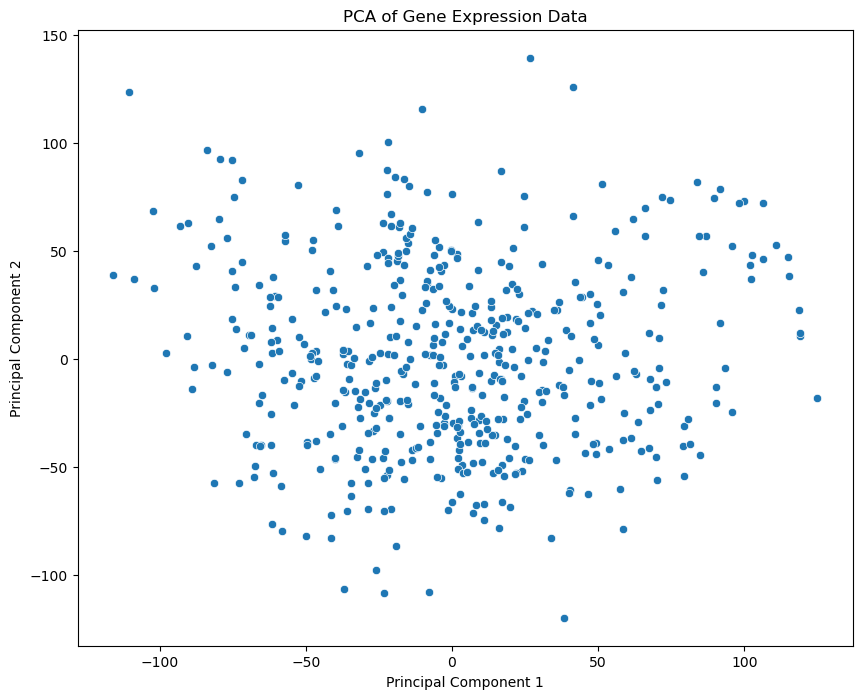

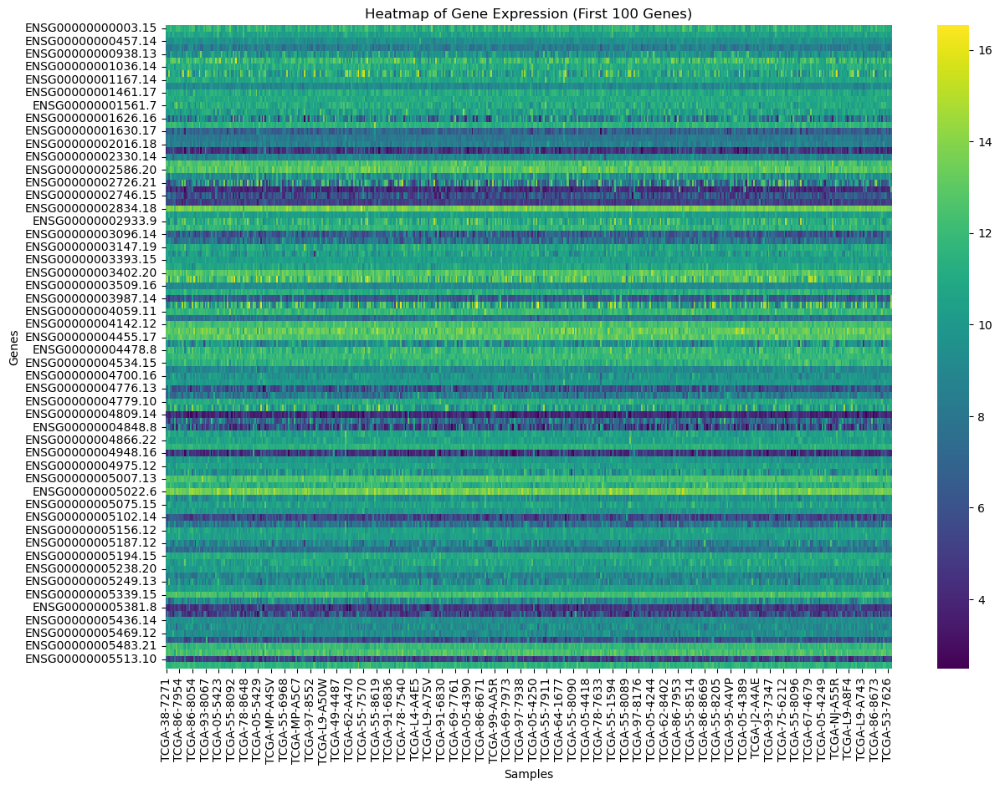

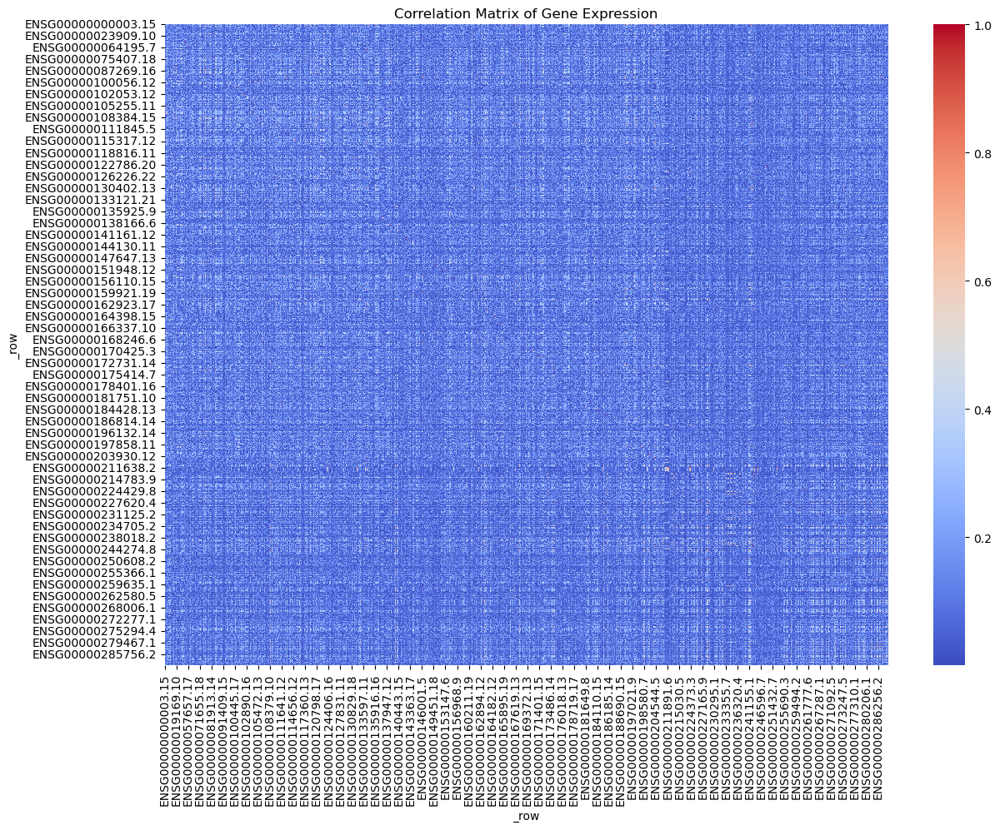

In [9]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Ensure all data is numeric
df = expression_data.apply(pd.to_numeric, errors='coerce')

# Handle missing values (e.g., fill with the mean of each column)
df.fillna(df.mean(), inplace=True)

# Standardize the data (mean=0, variance=1)
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df)

# Perform PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_data)

# Create a DataFrame with PCA results
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])
pca_df['Sample'] = df.index

# Plot PCA
plt.figure(figsize=(10, 8))
sns.scatterplot(x='PC1', y='PC2', data=pca_df)
plt.title('PCA of Gene Expression Data')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()


In [ ]:

# Plot Heatmap of the Gene Expression Matrix
plt.figure(figsize=(14, 10))
sns.heatmap(df.iloc[:, :100].transpose(), cmap='viridis')  # Visualize first 100 genes
plt.title('Heatmap of Gene Expression (First 100 Genes)')
plt.xlabel('Samples')
plt.ylabel('Genes')
plt.show()



In [ ]:
# Calculate and plot the correlation matrix
correlation_matrix = expression_data.corr().abs()
plt.figure(figsize=(14, 10))
sns.heatmap(correlation_matrix, cmap='coolwarm')
plt.title('Correlation Matrix of Gene Expression')
plt.show()

## 1.3 Check for NA, handling missing data, outlier check

In [11]:
# Check for missing values in each column
missing_values = expression_data.isnull().sum()

# Calculate the percentage of missing values for each column
missing_percentage = (missing_values / len(data)) * 100

# Create a DataFrame to hold the missing data statistics
missing_stats = pd.DataFrame({'Total Missing': missing_values, 'Percentage': missing_percentage})

# Filter to display only columns with missing values
missing_stats = missing_stats[missing_stats['Total Missing'] > 0]

# Print out the missing values statistics for columns with missing data
if not missing_stats.empty:
    print("Missing values in columns:")
    print(missing_stats)
else:
    print("No missing values found in the dataset.")

No missing values found in the dataset.


In [6]:
# Check for negative values

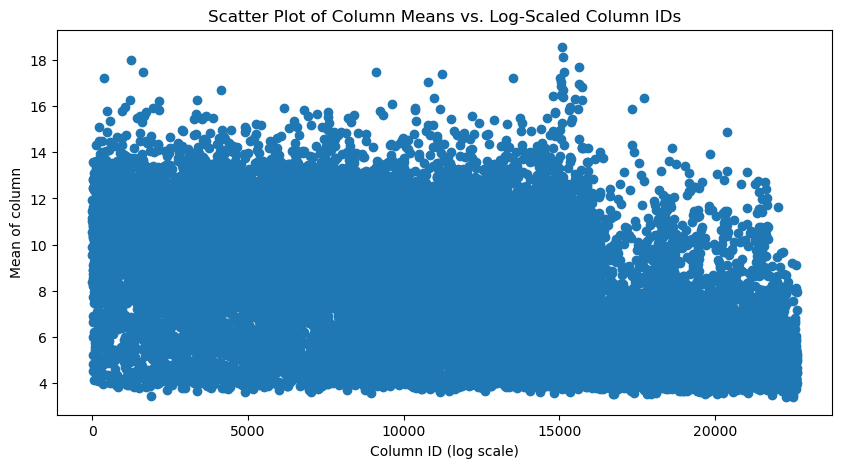

In [16]:
# Calculate the mean of each column
means = expression_data.mean()

# Create a list of column IDs (integer index)
column_ids = np.arange(len(expression_data.columns))

# Plotting
plt.figure(figsize=(10, 5))
plt.scatter(column_ids, means)

# Setting the x-axis to a log scale
#plt.yscale('log')

# Labeling the axes
plt.xlabel('Column ID (log scale)')
plt.ylabel('Mean of column')

# Adding a title
plt.title('Scatter Plot of Column Means vs. Log-Scaled Column IDs')

# Adjust xticks to label each point with the corresponding column name
#plt.xticks(column_ids, df.columns)

plt.show()

In [17]:
# Sort the means in descending order and get the top 10
top_10_columns = means.sort_values(ascending=False).head(10)

# Print the results
print("Top 10 columns based on their mean values:")
print(top_10_columns)

Top 10 columns based on their mean values:
_row
ENSG00000198804.2     18.559145
ENSG00000198886.2     18.126671
ENSG00000075624.17    17.986457
ENSG00000210082.2     17.720119
ENSG00000198938.2     17.488491
ENSG00000156508.19    17.486553
ENSG00000087086.15    17.465525
ENSG00000168878.19    17.408109
ENSG00000019582.15    17.223463
ENSG00000198712.1     17.222152
dtype: object


In [18]:
# Sort the means in ascending order and get the bottom 10
bottom_10_columns = means.sort_values(ascending=True).head(10)

# Print the results
print("Bottom 10 columns based on their mean values:")
print(bottom_10_columns)

Bottom 10 columns based on their mean values:
_row
ENSG00000287352.1     3.382421
ENSG00000286009.2     3.409152
ENSG00000092377.15    3.445005
ENSG00000279511.1     3.462593
ENSG00000287460.1     3.487666
ENSG00000236360.2      3.50303
ENSG00000235559.1     3.508753
ENSG00000261502.4     3.510562
ENSG00000226668.5     3.519898
ENSG00000259023.3     3.520722
dtype: object


## Handling Missing data ??
### TODO: low priority

## Data heterogeneity

In [34]:
import pandas as pd
import matplotlib.pyplot as plt

# Assume expression_data is already loaded
# Select numerical columns
numerical_columns = expression_data.select_dtypes(include=['float64', 'int64'])

# Calculate the mean of each column for the numerical columns only
means = numerical_columns.mean()

# Get the top 10 and bottom 10 columns based on mean values
top_10_columns = means.nlargest(10).index.tolist()
bottom_10_columns = means.nsmallest(10).index.tolist()

# Combine top 10 and bottom 10 columns for plotting
columns_to_plot = top_10_columns + bottom_10_columns

# Filter the numerical columns to only include those to plot
filtered_numerical_columns = numerical_columns[columns_to_plot]

# Calculate the number of rows needed for subplots based on the number of selected columns
num_plots = len(filtered_numerical_columns.columns)
num_rows = (num_plots // 4) + (num_plots % 4 > 0)  # Ensure there is an extra row if there are leftovers

# Plot histograms for each selected numerical column
fig, axes = plt.subplots(num_rows, 4, figsize=(20, 5 * num_rows))  # Adjust width and height as needed
fig.suptitle('Distribution of Selected Numerical Variables (Top 10 & Bottom 10)', fontsize=16)

for i, col in enumerate(filtered_numerical_columns.columns):
    ax = axes.flatten()[i]
    filtered_numerical_columns[col].hist(bins=15, ax=ax)
    ax.set_title(col)
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

# Hide any unused axes if the number of plots isn't a perfect multiple of 4
if num_plots % 4:
    for ax in axes.flatten()[num_plots:]:
        ax.set_visible(False)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the suptitle
plt.show()


ValueError: Number of rows must be a positive integer, not 0

<Figure size 2000x0 with 0 Axes>

In [28]:
numerical_columns

_row
TCGA-38-7271
TCGA-55-7914
TCGA-95-7043
TCGA-73-4658
TCGA-86-8076
...
TCGA-86-8073
TCGA-MN-A4N4
TCGA-53-7626
TCGA-44-A47G


# TODO: consider to DROP GENES BASED ON LOW EXPRESSION VALUE?
yes

In [19]:
# For categorical data, you can use bar plots to visualize the frequency of each category
categorical_columns = data.select_dtypes(include=['object']).columns
for column in categorical_columns:
    plt.figure(figsize=(10, 4))
    data[column].value_counts().plot(kind='bar')
    plt.title(f'Distribution of {column}')
    plt.show()

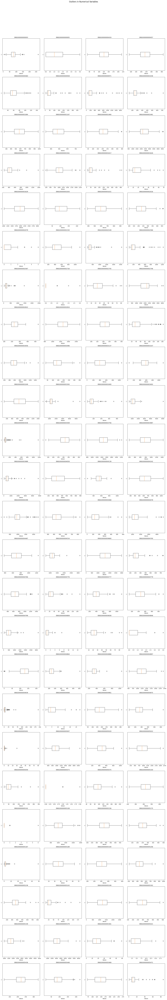

In [35]:
import matplotlib.pyplot as plt

numerical_columns = data.select_dtypes(include=['float64', 'int64'])

# Determine the number of rows and columns for the subplot grid
columns_per_row = 4  # Number of columns in each row of subplots
num_columns = len(numerical_columns.columns)
num_rows = (num_columns // columns_per_row) + (num_columns % columns_per_row > 0)

# Create a figure with subplots in a grid
fig, axes = plt.subplots(num_rows, columns_per_row, figsize=(20, 5 * num_rows))
fig.suptitle('Outliers in Numerical Variables', fontsize=16)

# Flatten axes array to simplify the loop logic
axes = axes.flatten()

for i, col in enumerate(numerical_columns.columns):
    # Plot boxplot for each column
    axes[i].boxplot(data[col].dropna(), vert=False)  # 'vert=False' makes the boxplot horizontal
    axes[i].set_title(col)
    axes[i].set_xlabel('Values')

# Hide unused axes if the number of plots isn't a perfect multiple of the number of columns per row
if num_columns % columns_per_row:
    for ax in axes[num_columns:]:
        ax.set_visible(False)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust the layout to make room for the suptitle
plt.show()

In [41]:
data = data.iloc[:, :10000]

AttributeError: 'dict' object has no attribute 'iloc'

In [5]:
data = expression_data

# TODO: ensg to gene name

In [12]:
import pandas as pd
import mygene

def rename_ensembl_to_gene_names(df, chunk_size=1000):
    """
    Renames Ensembl gene IDs to gene names using mygene.
    
    Parameters:
    df (pd.DataFrame): DataFrame with Ensembl gene IDs as columns.
    chunk_size (int): Number of Ensembl IDs to query at a time.
    
    Returns:
    pd.DataFrame: DataFrame with gene names as columns.
    """
    
    # Make a copy of the DataFrame to avoid modifying the original
    df_copy = df.copy()

    # Remove the `.number` suffix from ENSG IDs
    df_copy.columns = df_copy.columns.str.split('.').str[0]

    # Initialize mygene client
    mg = mygene.MyGeneInfo()

    # Split ENSG IDs into smaller chunks
    def chunks(lst, n):
        """Yield successive n-sized chunks from lst."""
        for i in range(0, len(lst), n):
            yield lst[i:i + n]

    ensg_ids = df_copy.columns.tolist()
    gene_mappings = []

    for chunk in chunks(ensg_ids, chunk_size):
        result = mg.querymany(chunk, scopes='ensembl.gene', fields='symbol', species='human')
        gene_mappings.extend(result)

    # Create a mapping from ENSG to gene symbol
    ensg_to_gene = {item['query']: item.get('symbol', item['query']) for item in gene_mappings if 'symbol' in item}

    # Map ENSG IDs to gene names using the dictionary
    mapped_columns = df_copy.columns.map(ensg_to_gene).tolist()

    # Fill missing values in the mapping with original ENSG IDs
    mapped_columns = [ensg_to_gene.get(x, x) for x in df_copy.columns]

    # Assign new column names
    df_copy.columns = mapped_columns

    # Handle duplicate gene names by aggregating them (e.g., by taking the mean)
    df_copy = df_copy.T.groupby(df_copy.columns).mean().T

    return df_copy

In [13]:
df_renamed = rename_ensembl_to_gene_names(expression_data)

# Continue with further analysis on df_renamed

1 input query terms found no hit:	['ENSG00000112096']
1 input query terms found no hit:	['ENSG00000130723']
1 input query terms found no hit:	['ENSG00000168078']
1 input query terms found no hit:	['ENSG00000180525']
1 input query terms found no hit:	['ENSG00000189144']
1 input query terms found no hit:	['ENSG00000205485']
6 input query terms found no hit:	['ENSG00000215271', 'ENSG00000221995', 'ENSG00000225178', 'ENSG00000225932', 'ENSG00000226377', 'ENS
1 input query terms found dup hits:	[('ENSG00000230373', 2)]
5 input query terms found no hit:	['ENSG00000228906', 'ENSG00000232295', 'ENSG00000234290', 'ENSG00000235245', 'ENSG00000236740']
1 input query terms found dup hits:	[('ENSG00000249738', 2)]
6 input query terms found no hit:	['ENSG00000237513', 'ENSG00000237548', 'ENSG00000239467', 'ENSG00000239665', 'ENSG00000244693', 'ENS
10 input query terms found no hit:	['ENSG00000253878', 'ENSG00000253948', 'ENSG00000254615', 'ENSG00000255495', 'ENSG00000255823', 'ENS
11 input query ter

In [21]:
df_renamed

,A1BG,A1BG-AS1,A2M,A2M-AS1,A2ML1,A2MP1,A4GALT,AAAS,AACS,AACSP1,...,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3
TCGA-38-7271,3.8172,6.1071,17.7492,6.1774,4.4411,4.0073,10.1862,10.4701,10.4005,3.5845,...,8.839,9.2615,7.8466,10.0009,10.3691,4.0073,10.9337,13.459,11.4001,10.6983
TCGA-55-7914,3.3382,5.0222,14.8513,5.196,4.453,3.3382,8.9312,10.453,11.2418,3.6762,...,8.9667,10.1334,7.7041,9.7997,10.8964,8.3219,12.1025,12.1144,10.8756,11.4452
TCGA-95-7043,2.4821,3.6226,14.1691,5.2453,4.5026,2.4821,9.0834,10.3984,11.9608,3.8623,...,9.9314,10.9149,7.7855,10.4953,11.2329,6.7593,10.6353,10.8503,10.8315,10.5512
TCGA-73-4658,4.8183,6.8567,16.7238,5.3295,3.1704,3.6533,9.1443,9.9395,10.727,2.4821,...,9.121,9.7828,7.6735,10.012,9.9808,3.4468,11.221,13.7827,10.5043,10.4167
TCGA-86-8076,3.746,5.7755,15.6783,5.1782,4.7422,4.3433,9.515,10.5227,10.9683,3.2271,...,9.0678,8.664,7.6321,9.4892,10.4895,4.7844,10.6306,12.4736,11.4232,11.1008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TCGA-86-8073,4.6207,5.8899,16.3773,6.043,4.0817,4.589,9.4234,10.3436,10.3197,6.6519,...,9.3987,10.139,7.8452,9.8617,10.4649,8.2478,11.4862,12.7339,11.4093,11.3514
TCGA-MN-A4N4,4.3317,6.5095,14.9411,6.6811,6.721,4.4719,11.9107,10.8047,11.1371,8.8283,...,8.7048,10.0583,6.882,9.148,10.8805,8.4566,10.8732,12.9752,10.5736,10.6339
TCGA-53-7626,4.3721,6.3313,16.7343,6.1172,5.2575,4.4566,9.5379,10.15,10.2079,2.4821,...,8.7775,9.4627,8.6497,10.0099,10.4984,7.4014,10.9402,13.1232,11.4838,10.7697
TCGA-44-A47G,4.6804,7.1615,15.6622,5.1263,3.7345,4.9218,9.866,10.5765,10.0678,4.1045,...,8.8003,9.5817,6.9551,8.722,10.1987,4.6804,10.61,12.9815,11.1138,10.3326


In [19]:
gene_names = pd.DataFrame(df_renamed.columns.to_list(), columns=["gene_symbol"])
gene_names.to_csv(r"C:\cdt_data\ismb_data\gene_symbols.csv", index = False)

In [ ]:
>>> import pandas as pd
>>> df = pd.DataFrame(some_list, columns=["colummn"])
>>> df.to_csv('list.csv', index=False)

In [ ]:

# Calculate the co-expression matrix (correlation matrix)
coexpression_matrix = df_renamed.corr()

# Save the co-expression matrix to a file (optional)
#coexpression_matrix.to_csv('coexpression_matrix.csv')

# Define a threshold for significant correlations
threshold = 0.8

# Create a NetworkX graph from the co-expression matrix
G = nx.Graph()

# Add nodes (genes) to the graph
for gene in coexpression_matrix.columns:
    G.add_node(gene)

# Add edges (significant correlations) to the graph
for i, gene1 in enumerate(coexpression_matrix.columns):
    for j, gene2 in enumerate(coexpression_matrix.columns):
        if i < j:  # Avoid duplicate edges and self-loops
            correlation = coexpression_matrix.iloc[i, j]
            if abs(correlation) >= threshold:
                G.add_edge(gene1, gene2, weight=correlation)

# Print some information about the graph
print(nx.info(G))


In [51]:
# Normalizing data - Log transformation
# Adding a pseudocount to avoid log(0) which is undefined
def log_transform(data):
    # Log transformation (log2(x + 1))
    return np.log2(data + 1)

def min_max_scale(data):
    # Min-Max scaling
    return (data - data.min()) / (data.max() - data.min())



In [52]:
# Dictionary to store different correlation matrices
correlation_matrices = {}

# Original data correlation (if applicable/necessary)
correlation_matrices['original'] = df_renamed.corr(method='pearson')

In [ ]:


# Log transformed data correlation
normalized_log = log_transform(data)
correlation_matrices['log_transformed'] = normalized_log.corr(method='pearson')

# Min-Max scaled data correlation
normalized_min_max = min_max_scale(data)
correlation_matrices['min_max_scaled'] = normalized_min_max.corr(method='pearson')

# Access and use a specific correlation matrix
print("Correlation matrix - Log Transformed:")
#print(correlation_matrices['log_transformed'])



In [ ]:
# Spearman correlation
from scipy.spatial.distance import pdist, squareform


correlation_matrices['spearman'] = data.corr(method='spearman')

# Euclidean distance - converting distance matrix to a DataFrame for compatibility
euclidean_distances = squareform(pdist(data, metric='euclidean'))
correlation_matrices['euclidean'] = pd.DataFrame(euclidean_distances, index=data.index, columns=data.index)

# Now you can access and use the Spearman correlation matrix or the Euclidean distance matrix
print("Spearman Correlation Matrix:")
#print(correlation_matrices['spearman'])

print("\nEuclidean Distance Matrix:")
#print(correlation_matrices['euclidean'])


In [ ]:
# TODO: FIX ABS_BICORR

def abs_bicorr(data) : 

    data = data._get_numeric_data()
    cols = data.columns
    idx = cols.copy()
    mat = data.to_numpy(dtype=float, na_value=np.nan, copy=False)
    mat = mat.T

    K = len(cols)
    correl = np.empty((K, K), dtype=np.float32)
    mask = np.isfinite(mat)

    bicorr = astropy.stats.biweight_midcovariance(mat)

    for i in range(K) : 
        correl[i , : ] = bicorr[i , :] / np.sqrt(bicorr[i,i] * np.diag(bicorr))
        
    return pd.DataFrame(data = correl , index=idx , columns=cols , dtype=np.float32)

In [14]:
# List columns that start with "__"
prefix = "__"
columns_starting_with_prefix = [col for col in df.columns if col.startswith(prefix)]

# Print the results
print("Columns starting with '__':")
print(columns_starting_with_prefix)

Columns starting with '__':
['__no_feature', '__ambiguous', '__too_low_aQual', '__not_aligned', '__alignment_not_unique']


In [15]:
# drop weird columns
data.drop(columns = columns_starting_with_prefix, inplace=True)

In [6]:
correlation_matrices = {}
correlation_matrices['original'] = data.corr(method='pearson')


# TODO: what kind of clustering happens in the following heatmaps

KeyError: 'log_transformed'

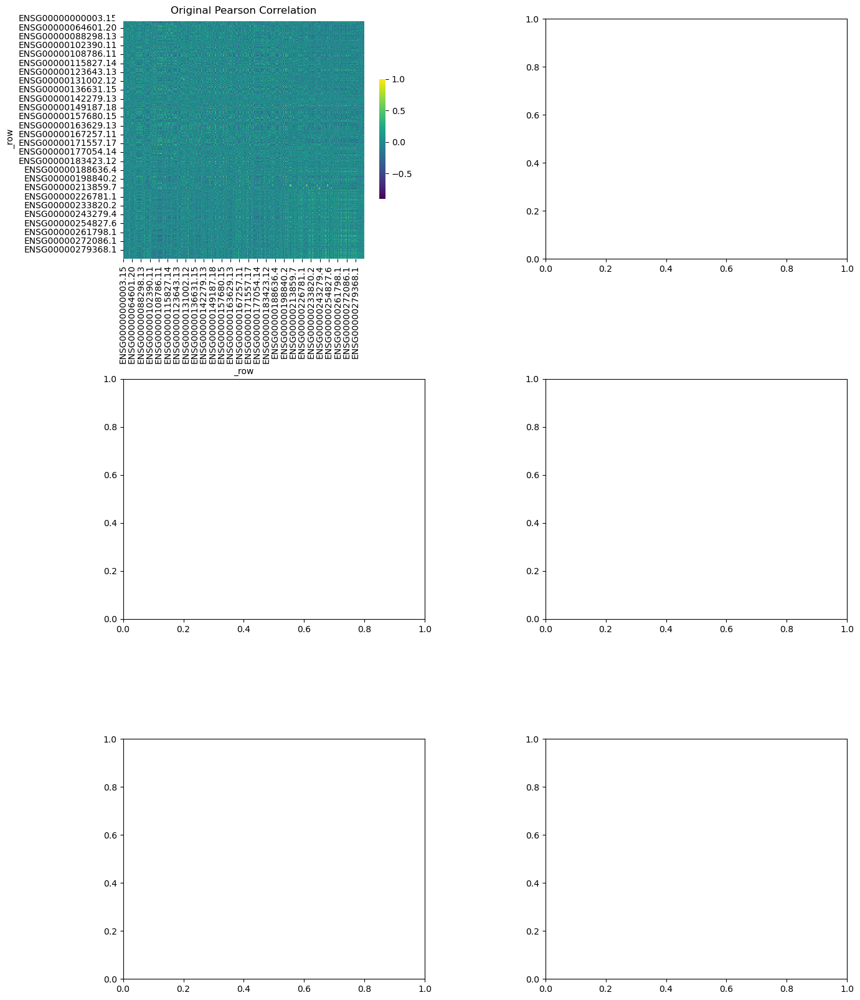

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_matrix(matrix, title, ax):
    # Heatmap of the correlation or distance matrix
    sns.heatmap(matrix, ax=ax, cmap='viridis', cbar_kws={'shrink': .5}, annot=True, fmt=".2f")
    ax.set_title(title)

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 20))
fig.subplots_adjust(hspace=0.5, wspace=0.4)

# Plot each matrix
plot_matrix(correlation_matrices['original'], 'Original Pearson Correlation', axes[0, 0])
plot_matrix(correlation_matrices['log_transformed'], 'Log Transformed Pearson Correlation', axes[0, 1])
plot_matrix(correlation_matrices['min_max_scaled'], 'Min-Max Scaled Pearson Correlation', axes[1, 0])
plot_matrix(correlation_matrices['spearman'], 'Spearman Correlation', axes[1, 1])
plot_matrix(correlation_matrices['euclidean'], 'Euclidean Distance', axes[2, 0])

# Hide the unused subplot (if any)
axes[2, 1].set_visible(False)

plt.show()

In [7]:
# Alternatively use WGCNA ?
# https://github.com/mortazavilab/PyWGCNA?tab=readme-ov-file
# https://en.wikipedia.org/wiki/Weighted_correlation_network_analysis#:~:text=Weighted%20correlation%20network%20analysis%2C%20also,on%20pairwise%20correlations%20between%20variables.

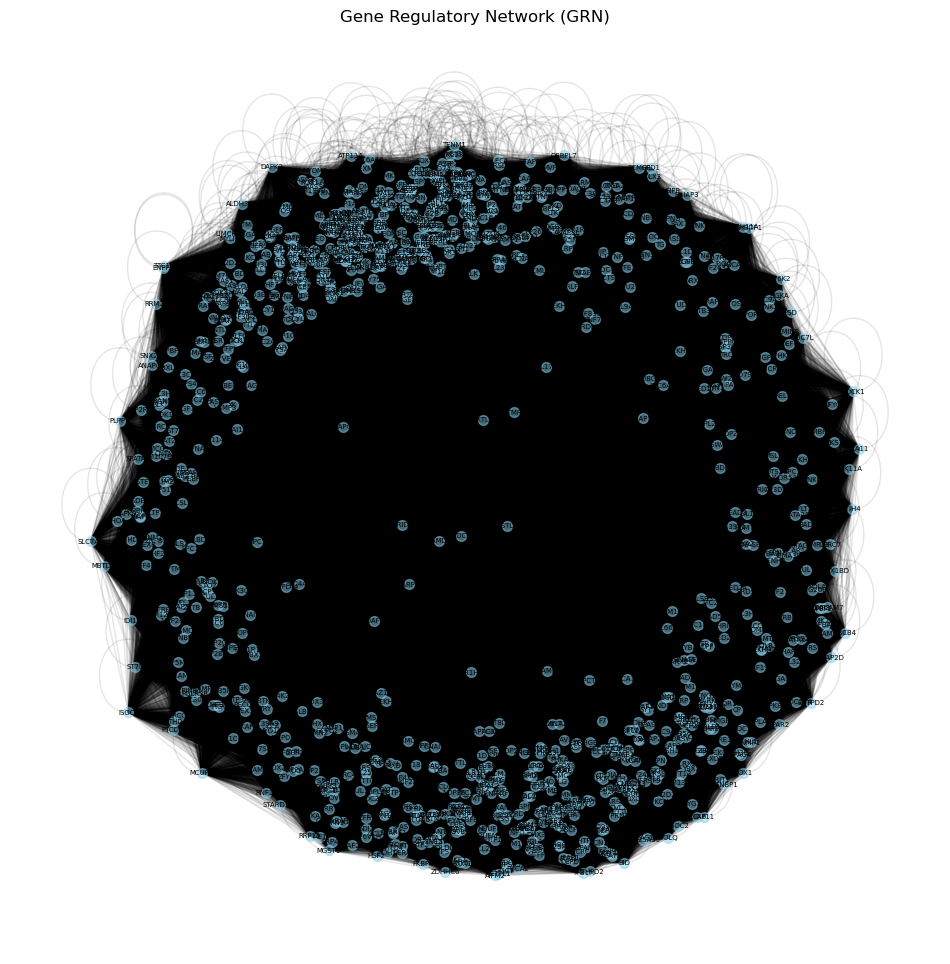

In [53]:
# Create a graph from the adjacency matrix
G = nx.from_pandas_adjacency(correlation_matrices['original'])

# Plot the network
plt.figure(figsize=(12, 12))
# Position nodes using the spring layout algorithm for nice aesthetics
pos = nx.spring_layout(G)
# Draw nodes and edges
nx.draw_networkx_nodes(G, pos, node_color='skyblue', alpha=0.5, node_size=50)
nx.draw_networkx_edges(G, pos, alpha=0.1)
# Draw node labels
nx.draw_networkx_labels(G, pos, font_size=5, font_family='sans-serif')

# Remove the axis
plt.axis('off')
plt.title('Gene Regulatory Network (GRN)')
plt.show()

In [30]:
correlation_matrices['original']

Patient_ID,ENSG00000000003,ENSG00000000005,ENSG00000000419,ENSG00000000457,ENSG00000000460,ENSG00000000938,ENSG00000000971,ENSG00000001036,ENSG00000001084,ENSG00000001167,...,ENSG00000155621,ENSG00000155622,ENSG00000155629,ENSG00000155636,ENSG00000155640,ENSG00000155657,ENSG00000155659,ENSG00000155660,ENSG00000155666,ENSG00000155714
Patient_ID,,,,,,,,,,,,,,,,,,,,,
ENSG00000000003,1.000000,-0.042486,0.298026,0.223362,0.291175,0.305384,0.423688,0.658827,0.462417,0.432857,...,0.353418,NaN,0.481082,0.283031,0.052522,0.246133,0.453718,0.339164,-0.164747,-0.096215
ENSG00000000005,-0.042486,1.000000,0.177769,0.162953,-0.112138,0.003452,0.035166,0.039170,-0.020925,-0.210681,...,-0.273364,NaN,0.044157,-0.032397,-0.008614,-0.001983,0.010526,-0.111242,-0.028133,0.143119
ENSG00000000419,0.298026,0.177769,1.000000,0.597557,0.093545,-0.007350,0.067359,0.335385,0.428808,0.222787,...,0.167196,NaN,0.181603,0.297941,0.111203,-0.171529,0.062529,0.359968,0.163283,0.165181
ENSG00000000457,0.223362,0.162953,0.597557,1.000000,0.277404,-0.159248,-0.048439,0.203196,0.380732,-0.009258,...,-0.040278,NaN,0.005829,0.476490,0.187316,-0.156072,-0.020087,-0.038488,0.480332,0.239516
ENSG00000000460,0.291175,-0.112138,0.093545,0.277404,1.000000,0.242848,0.223986,0.484996,0.109299,0.368052,...,0.340127,NaN,0.402731,0.459763,0.238576,0.000228,0.440603,0.246293,0.382062,0.123713
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000155657,0.246133,-0.001983,-0.171529,-0.156072,0.000228,-0.035157,0.076859,-0.024595,0.082845,0.153609,...,0.086302,NaN,-0.077452,0.117541,0.213879,1.000000,-0.100157,-0.023396,-0.007390,-0.009455
ENSG00000155659,0.453718,0.010526,0.062529,-0.020087,0.440603,0.749756,0.537771,0.726786,0.009087,0.197822,...,0.086919,NaN,0.944830,0.059042,0.239810,-0.100157,1.000000,0.462384,-0.123507,0.052848
ENSG00000155660,0.339164,-0.111242,0.359968,-0.038488,0.246293,0.671194,0.495571,0.649149,0.234953,0.475681,...,0.339656,NaN,0.621980,-0.089353,0.261522,-0.023396,0.462384,1.000000,-0.149444,0.131492


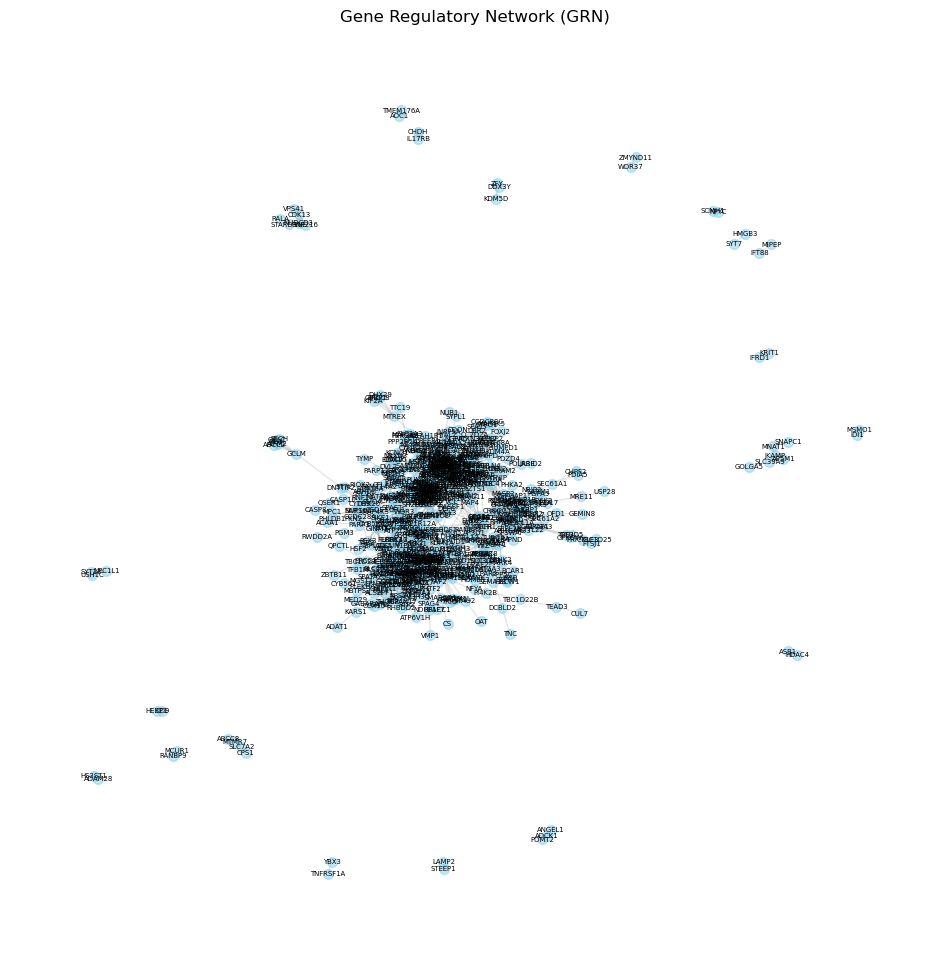

In [55]:
# Assuming 'filtered_correlation_matrix' is your thresholded correlation matrix from previous steps
threshold = 0.5
# Convert the filtered correlation matrix into an adjacency matrix for the graph
# We consider correlations above the threshold as edges in the network

# Create an identity matrix of the same size as the correlation matrix
identity_matrix = np.eye(len(correlation_matrices['original']))

# Create the adjacency matrix by converting the correlation matrix to binary based on the threshold
# and subtracting the identity matrix to remove self-connections
adjacency_matrix = (correlation_matrices['original'] > threshold).astype(int) - identity_matrix

# Convert adjacency matrix to an integer type, if necessary
adjacency_matrix = adjacency_matrix.astype(int)

# Ensure no negative values after subtraction (in case of numerical issues)
adjacency_matrix[adjacency_matrix < 0] = 0

# Replace zeros with NaN
adjacency_matrix.replace(0, np.nan, inplace=True)

# Drop all rows and columns that only contain NaN
adjacency_matrix.dropna(axis=0, how='all', inplace=True)  # Drop rows that have all NaN
adjacency_matrix.dropna(axis=1, how='all', inplace=True)  # Drop columns that have all NaN

# Optionally, replace NaNs back with zeros if needed for other processing
adjacency_matrix.fillna(0, inplace=True)

#adjacency_matrix = (correlation_matrix > threshold).astype(int)-np.eye
# print(adjacency_matrix)

# Create a graph from the adjacency matrix
G = nx.from_pandas_adjacency(adjacency_matrix)

# Plot the network
plt.figure(figsize=(12, 12))
# Position nodes using the spring layout algorithm for nice aesthetics
pos = nx.spring_layout(G)
# Draw nodes and edges
nx.draw_networkx_nodes(G, pos, node_color='skyblue', alpha=0.5, node_size=50)
nx.draw_networkx_edges(G, pos, alpha=0.1)
# Draw node labels
nx.draw_networkx_labels(G, pos, font_size=5, font_family='sans-serif')

# Remove the axis
plt.axis('off')
plt.title('Gene Regulatory Network (GRN)')
plt.show()

In [15]:
# G.edges(data=True)

In [56]:
# how many edges and nodes in the graph?
print('The graph has '+str(G.number_of_edges())+' edges and '+str(G.number_of_nodes())+' nodes.')

# divide the number of edges by the number of nodes to get the average degree
print('The average degree of the graph is '+str(G.number_of_edges()/G.number_of_nodes())+'.\n')

The graph has 2770 edges and 671 nodes.
The average degree of the graph is 4.128166915052161.



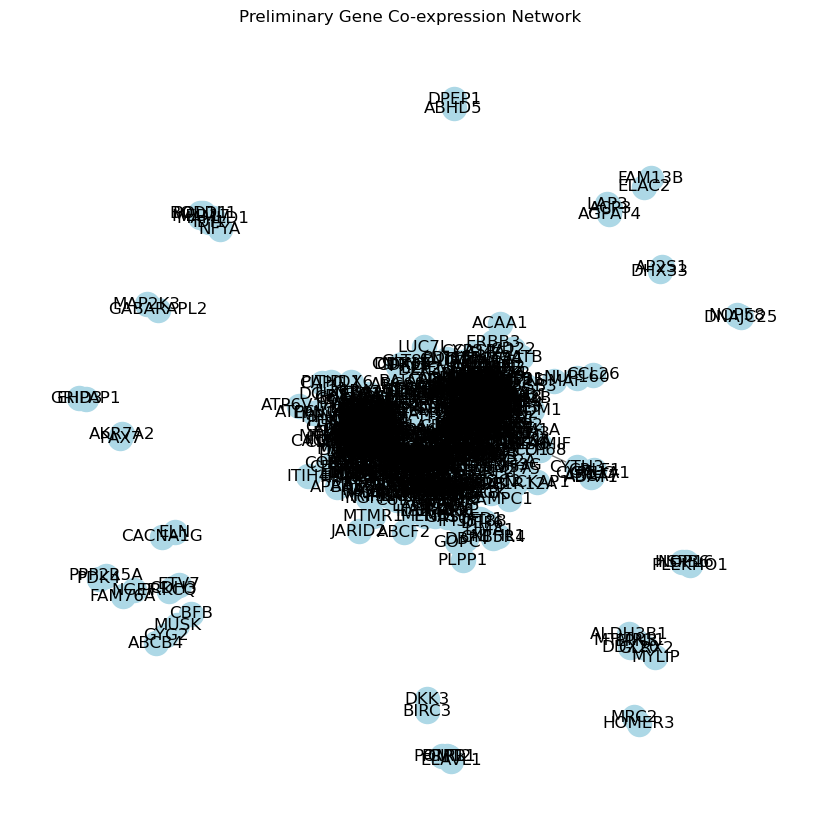

In [70]:
# Selecting a soft-thresholding power, this is usually done through analysis of the scale-free fit index
# For demonstration, we will assume a power of 6
# power = 6
# adjacency_matrix = np.power(correlation_matrix, power)

# Creating a networkx graph from the adjacency matrix

G = nx.from_numpy_array(adjacency_matrix.to_numpy())

# Relabel nodes to correspond to gene names
G = nx.relabel_nodes(G, dict(enumerate(correlation_matrices['original'].columns)))

# Visualizing the network
plt.figure(figsize=(8, 8))
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True, node_color='lightblue', edge_color='gray')
plt.title('Preliminary Gene Co-expression Network')
plt.show()

# Please note: This is a simplistic approach. The WGCNA package in R provides much more
# sophisticated methods for network construction and module detection.


## Sparsification of complex graphs

### Based on simple metrics 

In [75]:
# Create a weighted graph from the co-expression matrix
G = nx.Graph()
for i in coexpression_matrix.index:
    for j in coexpression_matrix.columns:
        if i != j:
            weight = coexpression_matrix.loc[i, j]
            G.add_edge(i, j, weight=weight)

# Check if the edges now have weights and print some edge data
print("Sample edges with weights after reassignment:")
for u, v, d in list(G.edges(data=True))[:10]:
    print(u, v, d)

# Extract weights of all edges for the updated graph
weights = [d['weight'] for u, v, d in G.edges(data=True)]

Sample edges with weights after reassignment:
AASS ABCA7 {'weight': 0.5227282436106547}
AASS ABCB4 {'weight': 0.42344405162454296}
AASS ABCC2 {'weight': 0.29627757570789937}
AASS ABCC8 {'weight': 0.5083611929291945}
AASS ABCF2 {'weight': 0.27362070569022134}
AASS ABHD5 {'weight': 0.397988224082234}
AASS ACAA1 {'weight': 0.4915320590618716}
AASS ACP3 {'weight': 0.45526261782753646}
AASS ACSL4 {'weight': 0.45234938851952755}
AASS ACSM3 {'weight': 0.5487191295119167}


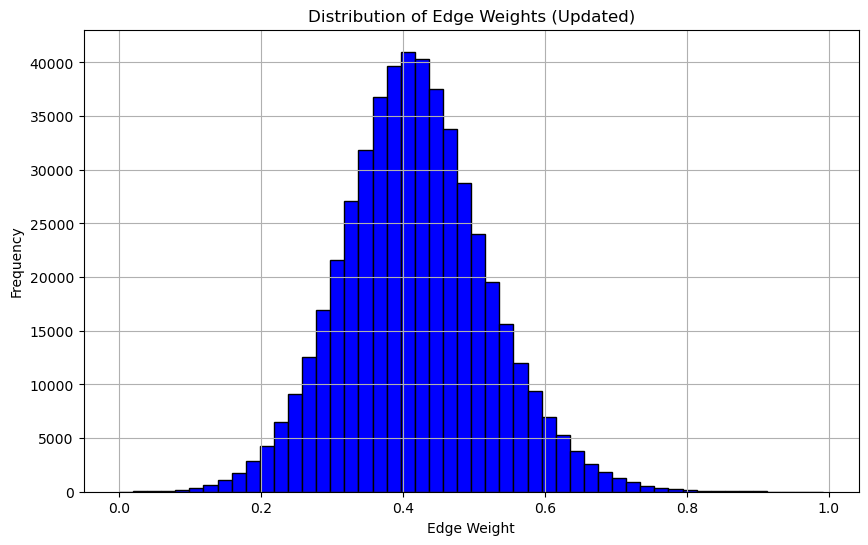

In [76]:

# Plot the distribution of weights for the updated graph
plt.figure(figsize=(10, 6))
plt.hist(weights, bins=50, color='blue', edgecolor='black')
plt.xlabel('Edge Weight')
plt.ylabel('Frequency')
plt.title('Distribution of Edge Weights (Updated)')
plt.grid(True)
plt.show()

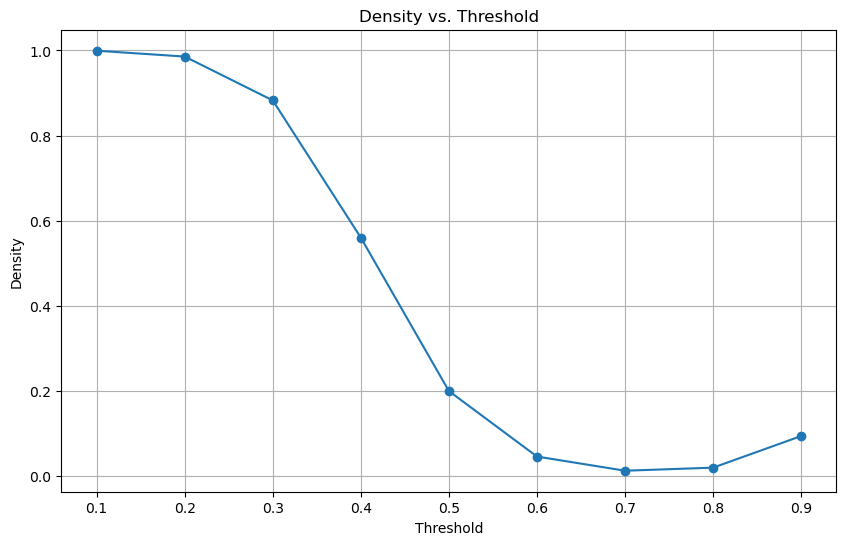

In [77]:
import matplotlib.pyplot as plt
import networkx as nx

# Function to calculate density for a series of thresholds
def analyze_density(graph, thresholds):
    densities = []
    for threshold in thresholds:
        filtered_edges = [(u, v) for u, v, d in graph.edges(data=True) if d['weight'] > threshold]
        temp_graph = nx.Graph()
        temp_graph.add_edges_from(filtered_edges)
        densities.append(nx.density(temp_graph))
    return densities

# Define the range of thresholds to analyze
thresholds = [i * 0.1 for i in range(1, 10)]  # Example: thresholds from 0.1 to 0.9

# Calculate densities for the original graph at different thresholds
densities = analyze_density(G, thresholds)

# Plot the densities
plt.figure(figsize=(10, 6))
plt.plot(thresholds, densities, marker='o')
plt.xlabel('Threshold')
plt.ylabel('Density')
plt.title('Density vs. Threshold')
plt.grid(True)
plt.show()

In [79]:


# Define the sparsification functions
def remove_by_closeness(graph, threshold=0.6):
    closeness = nx.closeness_centrality(graph)
    # Create a copy to modify
    modified_graph = graph.copy()
    for gene, centrality in closeness.items():
        if centrality < threshold:
            modified_graph.remove_node(gene)
    return modified_graph

def remove_by_degree(graph, min_degree=7):
    degrees = dict(graph.degree())
    # Create a copy to modify
    modified_graph = graph.copy()
    for gene, degree in degrees.items():
        if degree < min_degree:
            modified_graph.remove_node(gene)
    return modified_graph

# Initialize a dictionary to store graphs
graphs = {}
graphs['original'] = G.copy()  # Store the original graph

# Sparsification by weight threshold
chosen_threshold = 0.5  # Choose an appropriate threshold based on the density plot
filtered_edges = [(u, v) for u, v, d in G.edges(data=True) if d['weight'] > chosen_threshold]
graphs['threshold_0.5'] = nx.Graph()
graphs['threshold_0.5'].add_edges_from(filtered_edges)

# Sparsification by top percentage of weights
top_percentage = 10  # Top 10%
sorted_edges = sorted(G.edges(data=True), key=lambda x: x[2]['weight'], reverse=True)
top_edges_count = int(len(sorted_edges) * (top_percentage / 100))
graphs['top_10_percent'] = nx.Graph()
graphs['top_10_percent'].add_edges_from(sorted_edges[:top_edges_count])

# Apply closeness centrality sparsification
graphs['closeness_below_0.3'] = remove_by_closeness(G, threshold=0.3)

# Apply degree sparsification
graphs['degree_below_3'] = remove_by_degree(G, min_degree=3)


In [60]:
graphs['degree_below_3']

# TODO: density (networkx function) for a series of threshold, plot it and move on based on that
## check networkxs dedensification method

def display_graphs(graph_dict):
    pos = nx.spring_layout(graph_dict['original'], k=2)  # k=2 for more spaced out layout
    
    for name, graph in graph_dict.items():
        plt.figure(figsize=(15, 15))
        # Draw the graph using the specified options
        nx.draw(graph, pos=pos, with_labels=True, node_size=100,
                edge_color='gray', node_color='lightblue', width=0.5)
        plt.title(name)
        plt.show()

display_graphs(graphs)

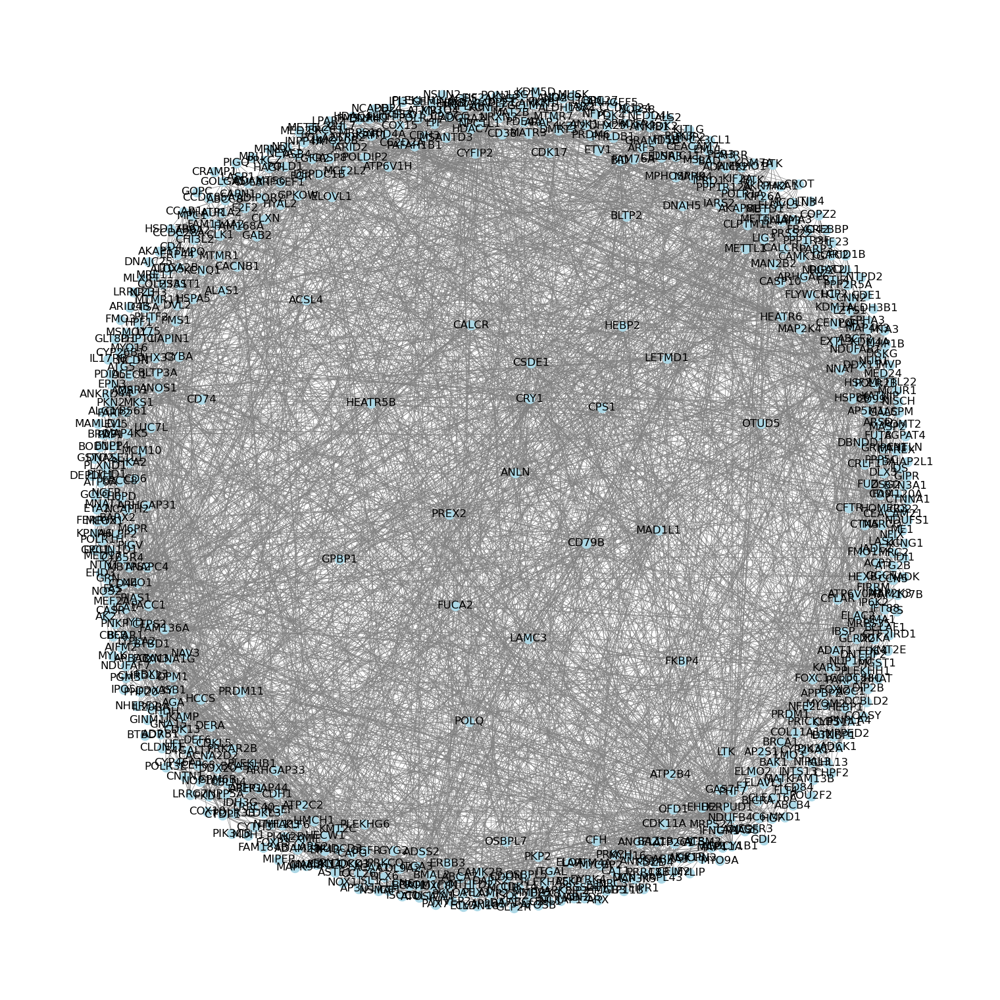

In [62]:
# draw the network with a force directed layout specify plot size and node size and thin light gray edges
plt.figure(figsize=(15,15))

nx.draw(graphs['original'], pos=nx.spring_layout(G,k=2), with_labels=True,node_size=100,edge_color='gray',node_color='lightblue',width=0.5)

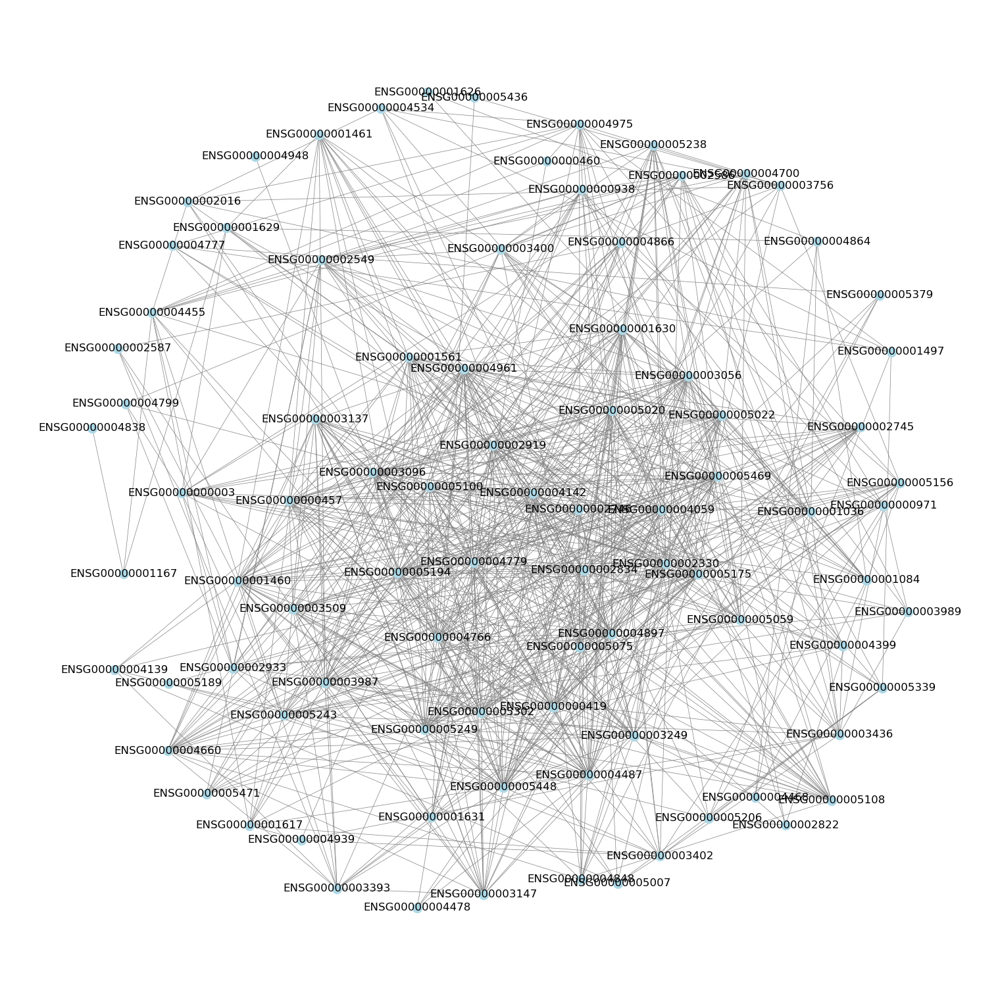

In [42]:
plt.figure(figsize=(15,15))
nx.draw(graphs['threshold_0.5'], pos=nx.spring_layout(G,k=2), with_labels=True,node_size=100,edge_color='gray',node_color='lightblue',width=0.5)


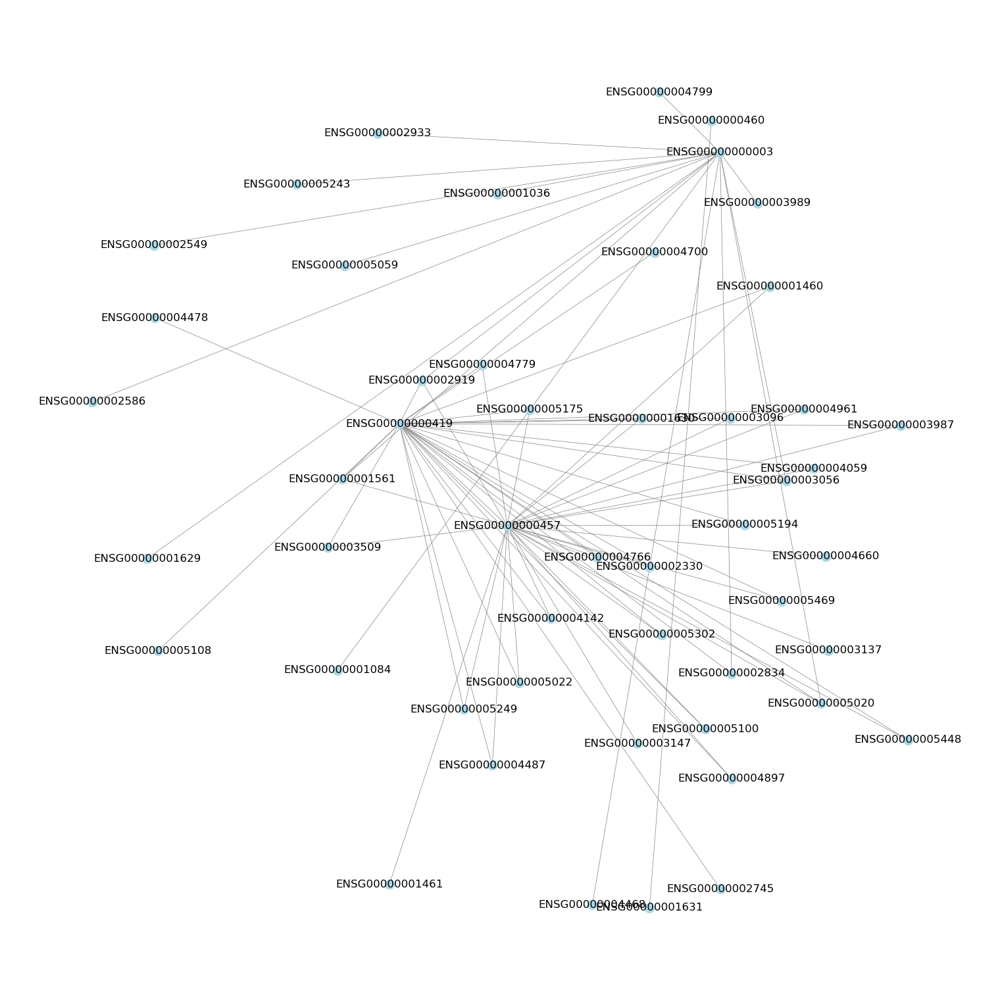

In [43]:
plt.figure(figsize=(15,15))
nx.draw(graphs['top_10_percent'], pos=nx.spring_layout(G,k=2), with_labels=True,node_size=100,edge_color='gray',node_color='lightblue',width=0.5)

In [18]:

# To iterate over all matrices and print them
for name, matrix in correlation_matrices.items():
    print(f"\n{name} Correlation Matrix:")
    print(matrix)


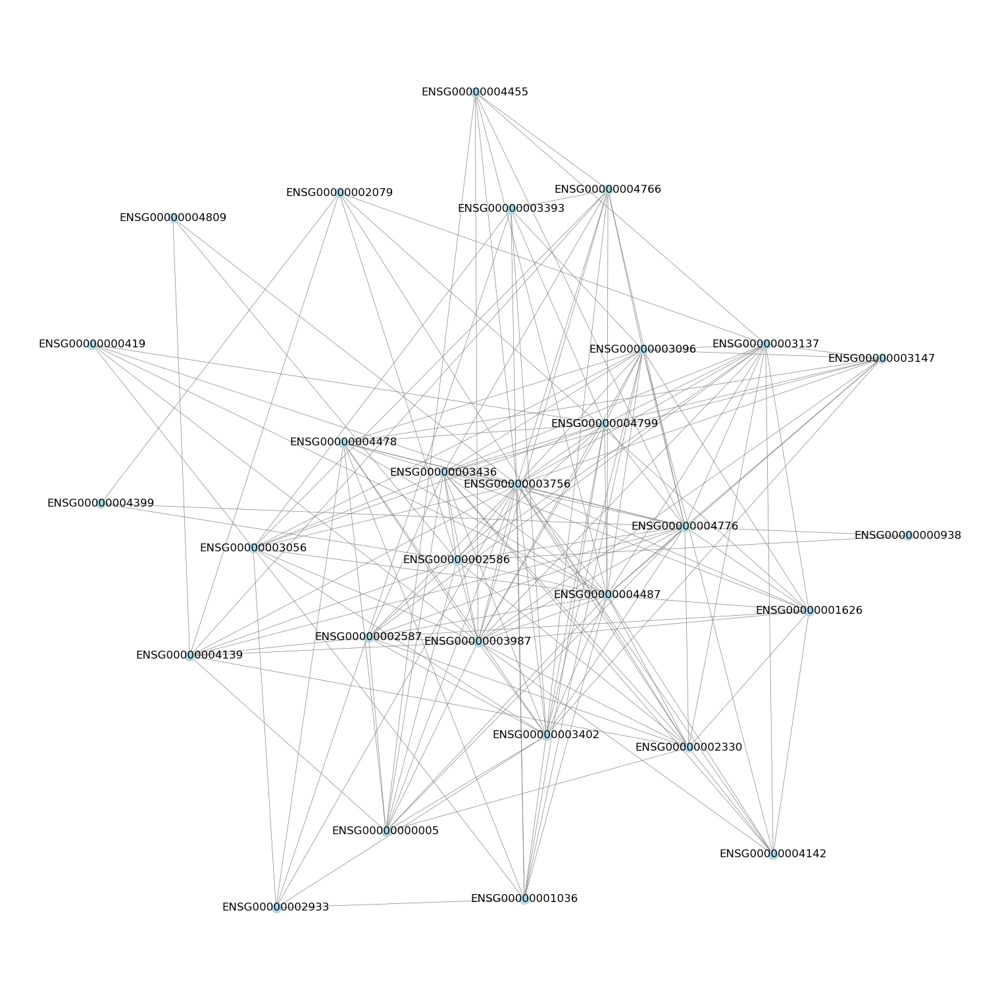

In [19]:
# draw the network with a force directed layout specify plot size and node size and thin light gray edges
plt.figure(figsize=(15,15))
nx.draw(G, pos=nx.spring_layout(G,k=2), with_labels=True,node_size=100,edge_color='gray',node_color='lightblue',width=0.5)

# Bicorr and KNN

In [66]:
def get_k_neighbours(df , k) : 
    k_neighbours = {}
    if abs(df.max().max()) > 1 : 
        print('Dataframe should be a similarity matrix of max value 1')
    else:
        np.fill_diagonal(df.values , 1)
        for node in df.index : 
            neighbours = df.loc[node].nlargest(k+1).index.to_list()[1:] #Exclude the node itself
            k_neighbours[node] = neighbours
        
    return k_neighbours

def plot_knn_network(df , K , labels , node_colours = ['skyblue'] , node_size = 300) : 
    # Get K-nearest neighbours for each node
    k_neighbours = get_k_neighbours(df , k = K)
    
    # Create a NetworkX graph
    G = nx.Graph()
    
        # Add nodes to the graph
    G.add_nodes_from(df.index)

    # Add edges based on the k-nearest neighbours
    for node, neighbours in k_neighbours.items():
        for neighbor in neighbours:
            G.add_edge(node, neighbor)

    plt.figure(figsize=(10, 8))
    nx.draw(G, with_labels=False, font_weight='bold', node_size=node_size, node_color=node_colours, font_size=8)
    
    return G

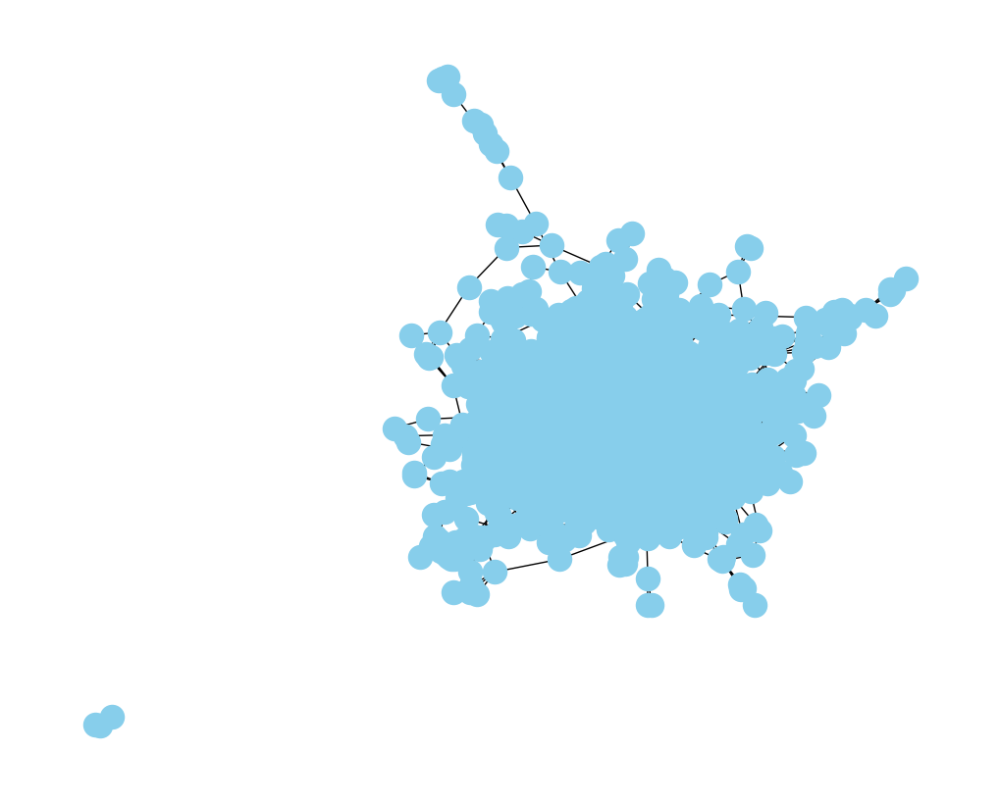

In [67]:
graphs['top_10_percent']
# Ensure the values are between 0 and 1 (if using a similarity measure that ranges between 0 and 1, like correlation)
coexpression_matrix = (correlation_matrices['original'] - correlation_matrices['original'].min().min()) / (correlation_matrices['original'].max().max() - correlation_matrices['original'].min().min())

# Define the number of nearest neighbors
K = 2

# Optionally, create a dictionary for node labels
labels = { 'Gene1': 'Gene 1', 'Gene2': 'Gene 2', 'Gene3': 'Gene 3', 'Gene4': 'Gene 4' }

# Plot the KNN network
G = plot_knn_network(coexpression_matrix, K, labels)

In [55]:
def apply_knn_sparsification(G, k=5, mode='distance'):
    """
    Apply kNN sparsification to the graph G.
    :param G: A NetworkX graph where edges have a 'weight' attribute.
    :param k: The number of nearest neighbors to retain for each node.
    :param mode: 'distance' (smaller is closer) or 'similarity' (larger is closer).
    """
    # Create a new graph to store the sparsified version
    sparsified_graph = nx.Graph()
    
    # Iterate over all nodes and apply kNN selection
    for node in G.nodes():
        neighbors = list(G[node].items())  # Get all neighbors and their edge data
        # Sort neighbors according to weight, which could represent distance or similarity
        if mode == 'distance':
            # For distance, closer neighbors have smaller weights; keep the smallest
            neighbors.sort(key=lambda x: x[1]['weight'])
            chosen_neighbors = neighbors[:k]  # Pick k smallest
        elif mode == 'similarity':
            # For similarity, closer neighbors have larger weights; keep the largest
            neighbors.sort(key=lambda x: x[1]['weight'], reverse=True)
            chosen_neighbors = neighbors[:k]  # Pick k largest

        # Add edges from the node to its k-nearest neighbors
        for neighbor, edge_data in chosen_neighbors:
            sparsified_graph.add_edge(node, neighbor, weight=edge_data['weight'])

    return sparsified_graph

# Example usage:
# Assuming 'G' is your original graph and each edge has a 'weight' attribute
k = 3  # Number of neighbors
sparsified_G = apply_knn_sparsification(G, k, mode='distance')  # Adjust mode based on your data


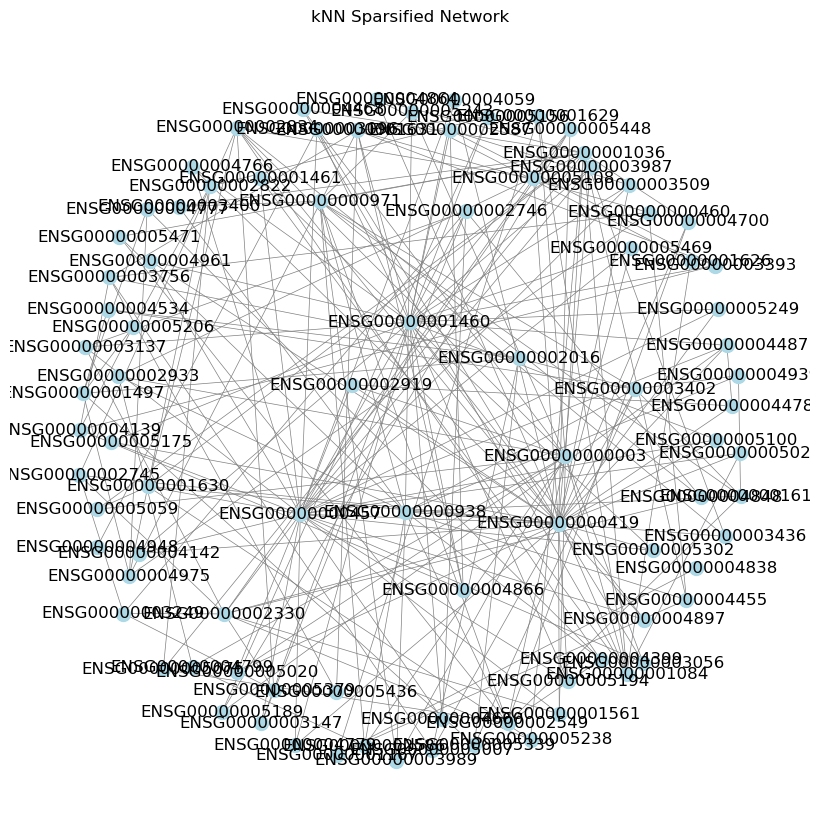

In [57]:
pos = nx.spring_layout(sparsified_G, k=2)  # k=2 increases the space between nodes

# Now, draw the graph with the specified node and edge aesthetics
plt.figure(figsize=(8, 8))
nx.draw(sparsified_G, pos, with_labels=True, node_size=100,
        edge_color='gray', node_color='lightblue', width=0.5)
plt.title("kNN Sparsified Network")
plt.show()

## Storing generated networks

# TODO save it into GML with networkx

In [ ]:
# Simple way to store them is in a pickle file

# Serialize and store the graph
with open('my_network_graph.pkl', 'wb') as f:
    pickle.dump(G, f)

In [ ]:
# and then loading it back to a NetworkX Graph object from the pickle file

# Load the graph
with open('my_network_graph.pkl', 'rb') as f:
    G_loaded = pickle.load(f)

# Inspect the loaded graph
print("Nodes:", G_loaded.nodes())
print("Edges:", G_loaded.edges(data=True))

In [29]:
## Autism Spectrum Disorder data

data = pd.read_csv(r"C:\cdt_data\ASD_magdalena\DS_10283_3827\RNASeq\RNASeq\RNAseq_ASD_datExpr.csv")

data.rename(columns={'Unnamed: 0': 'Patient_ID'}, inplace=True)

# data = data.head(100)

# Transpose the data so that genes are columns and rows are observations
data = data.set_index('Patient_ID').T
# data = data.iloc[:, :1000]


In [30]:
data

Patient_ID,ENSG00000000003,ENSG00000000005,ENSG00000000419,ENSG00000000457,ENSG00000000460,ENSG00000000938,ENSG00000000971,ENSG00000001036,ENSG00000001084,ENSG00000001167,...,ENSG00000273489,ENSG00000273490,ENSG00000273491,ENSG00000273492,ENSG00000273493,__no_feature,__ambiguous,__too_low_aQual,__not_aligned,__alignment_not_unique
01_052914,63,1,105,284,72,24,159,155,715,488,...,4,0,0,68,3,12726121,324319,0,0,5842658
01_053014,73,3,172,243,39,21,139,139,682,445,...,1,0,0,31,0,11801279,277372,0,0,3951895
01_061914,100,4,127,266,55,25,71,141,669,554,...,7,0,0,70,0,18192534,314101,0,0,7507251
01_072114,80,0,85,280,63,67,154,123,526,437,...,4,0,0,23,1,19509561,231035,0,0,3863531
01_072214,72,0,146,296,50,28,433,192,642,543,...,4,0,0,31,2,11825201,285657,0,0,4125572
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41_072214,81,2,126,193,55,61,192,135,513,516,...,26,0,0,36,1,19612339,239329,0,0,4656268
41_082014,64,2,106,222,41,27,129,131,434,423,...,9,0,0,29,3,14594164,238705,0,0,3922692
45_071514,78,1,160,277,75,46,153,169,690,580,...,4,0,0,20,4,14017074,317867,0,0,6812698
13_081514,72,1,78,238,90,11,61,107,707,562,...,8,0,0,24,2,18614266,275348,0,0,7636206


## Generation Scotland

In [ ]:
with open('../ISMB_GS_Data.pkl' , 'rb') as file : 
    loaded_data = pd.read_pickle(file)

In [ ]:
w1 = loaded_data['DNAm_w1'].dropna()
w3 = loaded_data['DNAm_w3'].dropna()
phenotypes = loaded_data['Phenotypes']

In [ ]:
# Setting Up the Programming Environment
# %pip install networkx

# import modules for use in the notebook

# handling www based requests (like APIs)
import urllib as ul

# standard Python data handling modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import json

# working with networks
import networkx as nx

# Setting up PIP network using String

In [ ]:
# create a concatenated list of gene names as strings
# note we are taking gene names from the 'gene' column of the dataframe we obtained from the EWAS catalog and filtered
# to common CpG and Gene sites above. The join function then concatenates them using the '%0D' string
# to stitch them all together. This string will be used to help us build the API query URL.
external_gene_names = '%0D'.join(map(str,df_filt['gene'].iloc[:300].drop_duplicates()))

# pass the list of Gene Names to the String-DB API return the String-IDs
# we first form the query url using the 'get_string_ids' API function which takes a list of identifiers and
# converts them into the internal String-DB accession IDs. This massively speeds up the search and allows us to
# search for more than 10 at once which is an API restriction for other API functions if String-DB internal accessions 
# aren't used.
query_url = 'https://string-db.org/api/tsv-no-header/get_string_ids?identifiers='+external_gene_names+'&species=9606&format=only-ids'

# use the urllib library to retrieve the String-DB internal IDs
result = ul.request.urlopen(query_url).read().decode('utf-8')

# now we want to query String-DB to retrieve interactions from this list of String-DB IDs
# we create a concatenated list of stringdbIDs in much the same way as above for the Entrez Gene IDs
stringdbIDs = '%0D'.join(result.splitlines())

# again we build the query for interactions using the String-DB IDs
query_url = 'https://string-db.org/api/tsv/network?identifiers='+stringdbIDs+'&species=9606'

# again using urllib to retrieve the interactions these are returned in a standard tab delimied text format
interactions = ul.request.urlopen(query_url).read().decode('utf-8').splitlines()

# we need to split the result by these 'tabs' (\t - is used to identfy them)
int_test = [interaction.split('\t') for interaction in interactions]

# we extract the field names from the first row
column_names = int_test[:1][0]

# create a Pandas dataframe of the interaction data we have just retrieved from String-DB
interactions_df = pd.DataFrame(int_test,columns=column_names)

# delete the first row that held the fieldnames but we no longer need
interactions_df = interactions_df.drop(labels=0,axis=0)

# remove any duplicate rows
final_interactions = interactions_df.drop_duplicates()

# show the top of the protein-protein interaction table
final_interactions.head()